In [3]:
# Operations Performed for Creating Model

# Importing Modules
# Loading Dataset
# EDA (Exploratory Data Analysis)
# Feature Extraction
# Model Creation
# Plot Model present in Tensorflow 
# Model Training
# Plot Result of Gender Graph
# Plot Result of Age Graph
# Model Prediction

## Importing Modules

In [4]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from tqdm.notebook import tqdm
warnings.filterwarnings('ignore')
%matplotlib inline

import tensorflow as tf
from keras.preprocessing.image import load_img
from keras.models import Sequential, Model
from keras.layers import Dense, Conv2D, Dropout, Flatten, MaxPooling2D, Input

## Loading Dataset

In [5]:
# Access the location where the dataset is present (Loading the Dataset)
BASE_DIR = '/kaggle/input/fulldataset/Full Dataset/UTKFace/'

In [6]:
# Age and Gender
def image_age_gender_paths(FILE_NAME):
    image_paths = []    # Store the path of every image
    age_labels = []     # Stores the age of every image
    gender_labels = []  # Stores the gender of every image (0=Male, 1=Female)

    # Traversing through all the images

    # tqdm is a iterator which will iterate over every image one by one
#     for filename in tqdm(os.listdir(BASE_DIR)):

    for filename in tqdm(os.listdir(FILE_NAME)):


        # image_path will store the loaction of each image with image name
#       image_path = os.path.join(BASE_DIR, filename) 
        image_path = os.path.join(FILE_NAME, filename) 

        # temp will store the image name after splitting it from '_'
        temp = filename.split('_')

        # age will store the age of each image 
        age = int(temp[0])

        # gender will store the age of each image 
        gender = int(temp[1])
    #     if(gender==0):
    #         gender="Male"
    #     else:
    #         gender="Female"

        # image_paths will store all the results stored in image_path
        image_paths.append(image_path)

        # age_labels will store all the results stored in age
        age_labels.append(age)
    
        # gender_labels will store all the results stored in gender
        gender_labels.append(gender)
        
    return image_paths,age_labels,gender_labels

In [7]:
image_paths = []    # Store the path of every image
age_labels = []     # Stores the age of every image
gender_labels = []  # Stores the gender of every image (0=Male, 1=Female)
image_paths,age_labels,gender_labels = image_age_gender_paths(BASE_DIR)

  0%|          | 0/23504 [00:00<?, ?it/s]

In [8]:
# Converting to dataframe

def convert_to_dataframe(image_paths,age_labels,gender_labels):
    # Dataframe() Creates a 2dimensional or 3dimensional array, or a table with rows and columns.
    df = pd.DataFrame() 

    # df['saba'],df['saif'],df['shiraz']=[[1,2,3],[4,5,6],[7,8,9]]
    #     saba     saif   shiraz
    # 0    1        4       7
    # 1    2        5       8
    # 2    3        6       9

    df['image'], df['age'], df['gender'] = image_paths, age_labels, gender_labels
    df.head()
    return df

In [9]:
  # Dataframe() Creates a 2dimensional or 3dimensional array, or a table with rows and columns.
# df = pd.DataFrame()
df = convert_to_dataframe(image_paths,age_labels,gender_labels)

In [10]:
df.head(10)

,image,age,gender
0,/kaggle/input/fulldataset/Full Dataset/UTKFace...,26,0
1,/kaggle/input/fulldataset/Full Dataset/UTKFace...,22,1
2,/kaggle/input/fulldataset/Full Dataset/UTKFace...,21,1
3,/kaggle/input/fulldataset/Full Dataset/UTKFace...,28,0
4,/kaggle/input/fulldataset/Full Dataset/UTKFace...,17,1
5,/kaggle/input/fulldataset/Full Dataset/UTKFace...,44,0
6,/kaggle/input/fulldataset/Full Dataset/UTKFace...,35,0
7,/kaggle/input/fulldataset/Full Dataset/UTKFace...,76,0
8,/kaggle/input/fulldataset/Full Dataset/UTKFace...,36,1
9,/kaggle/input/fulldataset/Full Dataset/UTKFace...,34,0


In [11]:
# Label 0 as Male and 1 as Female
gender_label = {0:'Male', 1:'Female'}

## Exploratory Data Analysis

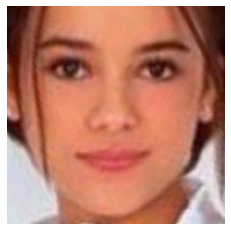

In [12]:
# PIL stands for Python Imaging Library, 
# and it's the original library that enabled Python to deal with images. 

from PIL import Image
img = Image.open(df['image'][10])  # store image in img 
plt.axis('off')
plt.imshow(img); # Display the image stored in img

<AxesSubplot:xlabel='age', ylabel='Density'>

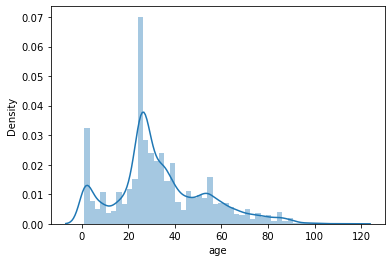

In [13]:
# Distplot is a distribution plot.
# It distributes the elements and display it in the fomm of graph. 

sns.distplot(df['age'])

<AxesSubplot:xlabel='gender', ylabel='Density'>

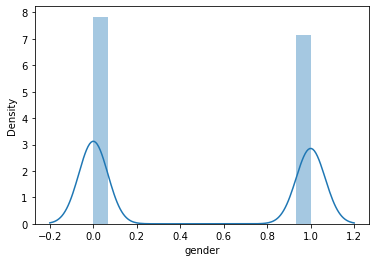

In [14]:
# Distplot is a distribution plot.
# It distributes the elements and display it in the fomm of graph. 

sns.distplot(df['gender'])

<AxesSubplot:xlabel='gender', ylabel='count'>

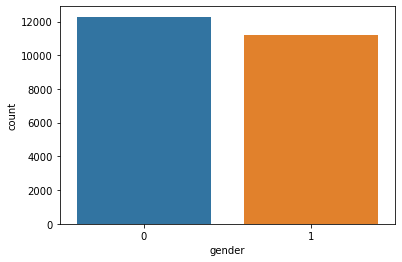

In [15]:
# Countplot count the number of element.
# It count the elements and display it in the form of graph of male and female. 

sns.countplot(df['gender'])

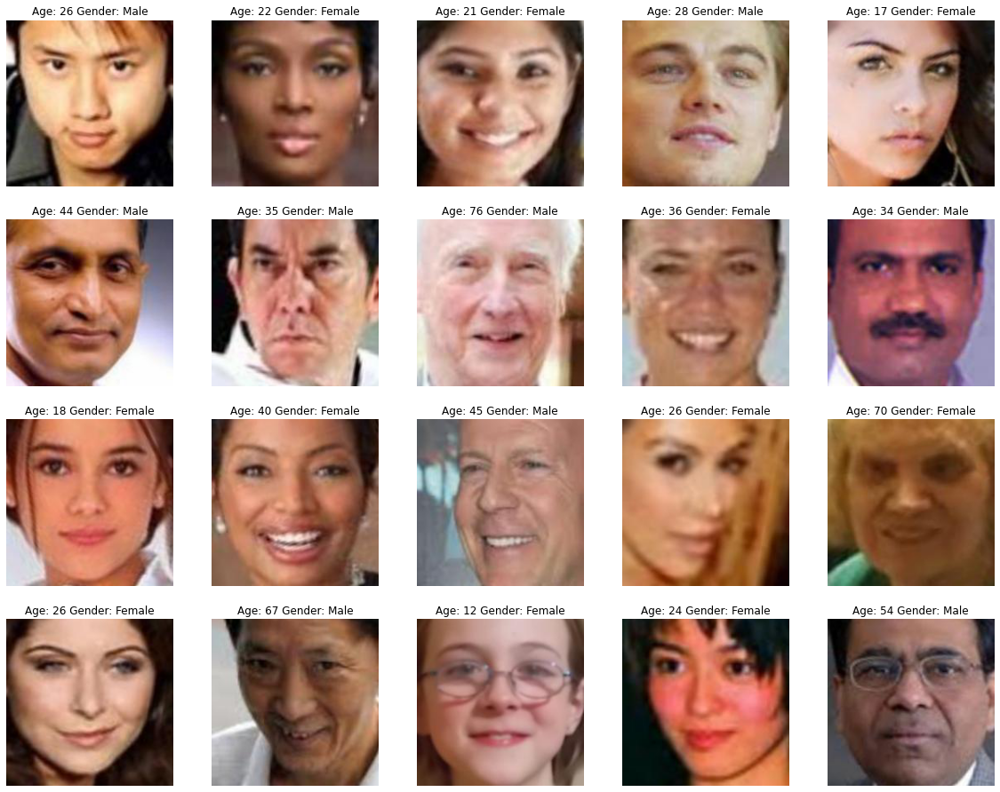

In [16]:
# To Display Image in form of Grid of Images

plt.figure(figsize=(20, 20)) # Plot the image in size 20 X 20
# .iloc[] is primarily integer position based (from 0 to length-1 of the axis)
images = df.iloc[0:20]        # Extract the first 25 index of df and store in files

# .itertuples Iterate over DataFrame rows as namedtuples.
for index, image, age, gender in images.itertuples():
    
    # Plot the image in 5 X 5 grid
    plt.subplot(5, 5, index+1)
    
    # Load image in img
    img = load_img(image)
#     print(img)

    # Convert the img in array form
    img = np.array(img)
#     print(img)
    
    # Plot the image
    plt.imshow(img)
    
    # Plot the gender
    plt.title(f"Age: {age} Gender: {gender_label[gender]}")
    
    plt.axis('off')

## Feature Extraction

In [17]:
def feature_extraction(images):
    features = []
    
    for image in tqdm(images):
        img = load_img(image,grayscale=True)
#         print(img)
#         plt.imshow(img)

#          Aliasing is the visual stair-stepping of edges that occurs in an image 
#         when the resolution is too low. Anti-aliasing is the smoothing of jagged edges 
#         in digital images by averaging the colors of the pixels at a boundary.
        img = img.resize((128,128),Image.ANTIALIAS)
    
#         print(img)
#         plt.imshow(img)

        img = np.array(img)
#         print(img)

        features.append(img)
#         print(features)

    features = np.array(features)
#     print(features)

#     ignore this step if using RGB
    features = features.reshape(len(features), 128, 128, 1)
    
    return features

In [18]:
# Stores all the feature extraction in feature_extracted
feature_extracted = feature_extraction(df['image'])

  0%|          | 0/23504 [00:00<?, ?it/s]

In [19]:
# print the shape of feature_extracted

feature_extracted.shape

(23504, 128, 128, 1)

In [20]:
# Normalize the image

feature_extracted = feature_extracted/255.0

In [21]:
# store_gender stores the gender of all the images.
# store_age stores the age of all the images.

store_gender = np.array(df['gender'])
store_age = np.array(df['age'])

In [22]:
input_shape = (128,128,1)

## Model Creation

## Convolutional Layers

In [23]:
inputs = Input((input_shape))

convolutional_layer_1 = Conv2D(32,kernel_size=(3,3),activation='relu')(inputs)
max_pooling_1 = MaxPooling2D(pool_size=(2,2)) (convolutional_layer_1)
convolutional_layer_2 = Conv2D(64,kernel_size=(3,3), activation='relu') (max_pooling_1)
max_pooling_2 = MaxPooling2D(pool_size=(2,2)) (convolutional_layer_2)
convolutional_layer_3 = Conv2D(64,kernel_size=(3,3), activation='relu') (max_pooling_2)
max_pooling_3 = MaxPooling2D(pool_size=(2,2)) (convolutional_layer_3)
convolutional_layer_4 = Conv2D(64,kernel_size=(3,3), activation='relu') (max_pooling_3)
max_pooling_4 = MaxPooling2D(pool_size=(2,2)) (convolutional_layer_4)

flatten = Flatten() (max_pooling_4)


# Fully Connected Layers

dense_1 = Dense(256, activation='relu') (flatten)
dense_2 = Dense(256, activation='relu') (flatten)

dropout_1 = Dropout(0.3) (dense_1)
dropout_2 = Dropout(0.3) (dense_2)

output_1 = Dense(1, activation='sigmoid', name='gender_out') (dropout_1)
output_2 = Dense(1, activation='relu', name='age_out') (dropout_2)

model = Model(inputs=[inputs], outputs=[output_1, output_2])

model.compile(loss=['binary_crossentropy', 'mae'], optimizer='adam', metrics=['accuracy'])

2023-02-09 18:46:46.962358: I tensorflow/core/common_runtime/process_util.cc:146] Creating new thread pool with default inter op setting: 2. Tune using inter_op_parallelism_threads for best performance.


In [24]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 128, 128, 1) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 126, 126, 32) 320         input_1[0][0]                    
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 63, 63, 32)   0           conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 61, 61, 64)   18496       max_pooling2d[0][0]              
______________________________________________________________________________________________

In [25]:
# Plot the model

# from tensorflow.keras.utils import plot_model
# plot_model(model)

In [26]:
# Train Model

# train_model = model.fit(x=feature_extracted, y=[store_gender, store_age], batch_size=32, epochs=30, validation_split=0.2)
train_model = model.fit(x=feature_extracted, y=[store_gender, store_age], batch_size=32, epochs=30, validation_split=0.2)

2023-02-09 18:46:49.052320: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Epoch 1/30
588/588 [==============================] - 158s 267ms/step - loss: 16.2092 - gender_out_loss: 0.6920 - age_out_loss: 15.5172 - gender_out_accuracy: 0.5331 - age_out_accuracy: 0.0454 - val_loss: 14.2084 - val_gender_out_loss: 0.6051 - val_age_out_loss: 13.6033 - val_gender_out_accuracy: 0.6679 - val_age_out_accuracy: 0.0440
Epoch 2/30
588/588 [==============================] - 168s 285ms/step - loss: 12.7291 - gender_out_loss: 0.5334 - age_out_loss: 12.1957 - gender_out_accuracy: 0.7338 - age_out_accuracy: 0.0416 - val_loss: 11.3705 - val_gender_out_loss: 0.4832 - val_age_out_loss: 10.8873 - val_gender_out_accuracy: 0.7664 - val_age_out_accuracy: 0.0287
Epoch 3/30
588/588 [==============================] - 173s 294ms/step - loss: 11.0263 - gender_out_loss: 0.4676 - age_out_loss: 10.5587 - gender_out_accuracy: 0.7776 - age_out_accuracy: 0.0243 - val_loss: 9.8906 - val_gender_out_loss: 0.4344 - val_age_out_loss: 9.4563 - val_gender_out_accuracy: 0.8047 - val_age_out_accuracy: 0

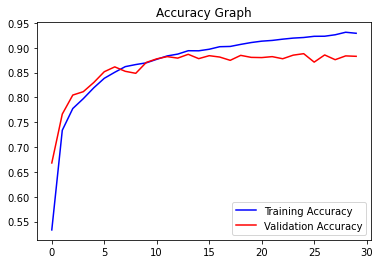

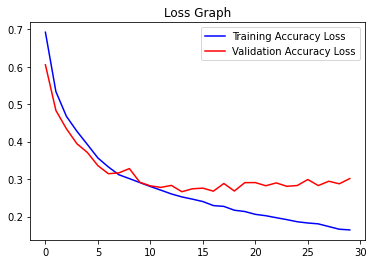

In [27]:
# Plot results for Gender

training_accuracy = train_model.history['gender_out_accuracy']
validation_accuracy = train_model.history['val_gender_out_accuracy']
epochs = range(len(training_accuracy))

plt.plot(epochs,training_accuracy,'b',label='Training Accuracy')
plt.plot(epochs,validation_accuracy,'r',label='Validation Accuracy')
plt.title('Accuracy Graph')
plt.legend()
plt.figure()

training_accuracy_loss = train_model.history['gender_out_loss']
validation_loss = train_model.history['val_gender_out_loss']

plt.plot(epochs,training_accuracy_loss,'b',label='Training Accuracy Loss')
plt.plot(epochs,validation_loss,'r',label='Validation Accuracy Loss')
plt.title('Loss Graph')
plt.legend()
plt.show()


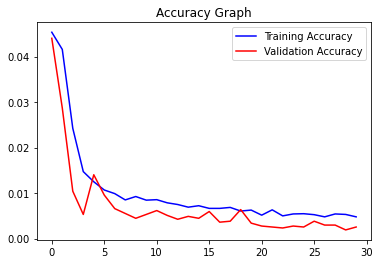

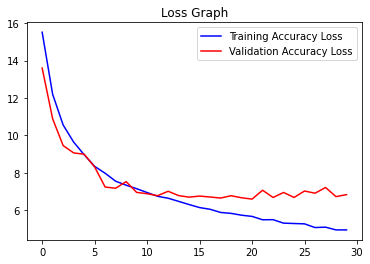

In [28]:
# Plot results for Age


training_accuracy = train_model.history['age_out_accuracy']
validation_accuracy = train_model.history['val_age_out_accuracy']
epochs = range(len(training_accuracy))

plt.plot(epochs,training_accuracy,'b',label='Training Accuracy')
plt.plot(epochs,validation_accuracy,'r',label='Validation Accuracy')
plt.title('Accuracy Graph')
plt.legend()
plt.figure()

training_accuracy_loss = train_model.history['age_out_loss']
validation_loss = train_model.history['val_age_out_loss']

plt.plot(epochs,training_accuracy_loss,'b',label='Training Accuracy Loss')
plt.plot(epochs,validation_loss,'r',label='Validation Accuracy Loss')
plt.title('Loss Graph')
plt.legend()
plt.show()


## Prediction with Test Data

Original Gender =  Female Original Age =  3
Predicted Gender =  Female Predicted Age =  0


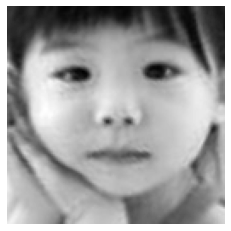

In [29]:
image_index = 100
print("Original Gender = ",gender_label[store_gender[image_index]], "Original Age = ",store_age[image_index])

# Predict from model

predict_from_model = model.predict(feature_extracted[image_index].reshape(1,128,128,1))
predict_gender = gender_label[round(predict_from_model[0][0][0])]
predict_age = round(predict_from_model[1][0][0])

print("Predicted Gender = ",predict_gender,"Predicted Age = ",predict_age)
plt.axis('off')
plt.imshow(feature_extracted[image_index].reshape(128,128),cmap='gray')

Original Gender =  Male Original Age =  61
Predicted Gender =  Male Predicted Age =  69


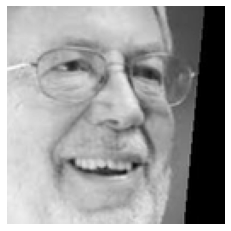

In [30]:
image_index = 222
print("Original Gender = ",gender_label[store_gender[image_index]], "Original Age = ",store_age[image_index])

# Predict from model

predict_from_model = model.predict(feature_extracted[image_index].reshape(1,128,128,1))
predict_gender = gender_label[round(predict_from_model[0][0][0])]
predict_age = round(predict_from_model[1][0][0])

print("Predicted Gender = ",predict_gender,"Predicted Age = ",predict_age)
plt.axis('off')
plt.imshow(feature_extracted[image_index].reshape(128,128),cmap='gray')

Original Gender =  Male Original Age =  61
Predicted Gender =  Male Predicted Age =  69


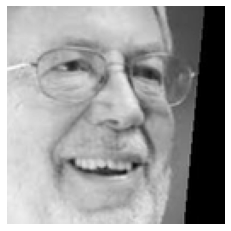

Original Gender =  Female Original Age =  22
Predicted Gender =  Female Predicted Age =  32


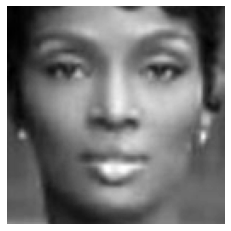

Original Gender =  Female Original Age =  21
Predicted Gender =  Female Predicted Age =  22


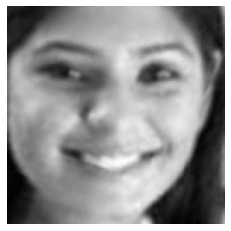

Original Gender =  Male Original Age =  28
Predicted Gender =  Male Predicted Age =  27


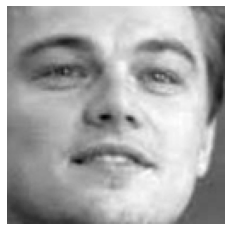

Original Gender =  Female Original Age =  17
Predicted Gender =  Female Predicted Age =  26


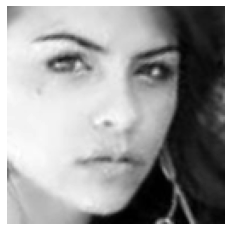

Original Gender =  Male Original Age =  44
Predicted Gender =  Male Predicted Age =  47


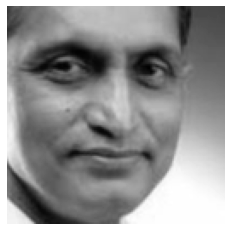

Original Gender =  Male Original Age =  35
Predicted Gender =  Male Predicted Age =  40


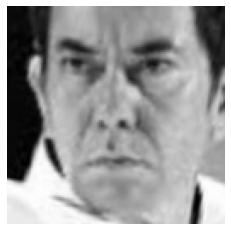

Original Gender =  Male Original Age =  76
Predicted Gender =  Male Predicted Age =  87


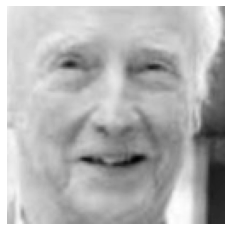

Original Gender =  Female Original Age =  36
Predicted Gender =  Female Predicted Age =  38


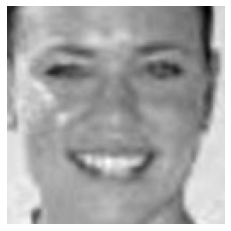

Original Gender =  Male Original Age =  34
Predicted Gender =  Male Predicted Age =  43


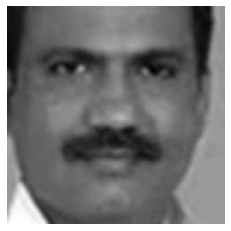

Original Gender =  Female Original Age =  18
Predicted Gender =  Female Predicted Age =  24


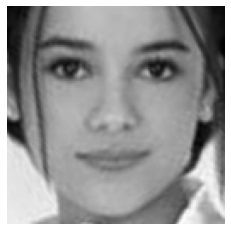

In [31]:
image_indexs = [222,1,2,3,4,5,6,7,8,9,10]
for image_index in image_indexs:
    print("Original Gender = ",gender_label[store_gender[image_index]], "Original Age = ",store_age[image_index])

    # Predict from model

    predict_from_model = model.predict(feature_extracted[image_index].reshape(1,128,128,1))
    predict_gender = gender_label[round(predict_from_model[0][0][0])]
    predict_age = round(predict_from_model[1][0][0])

    print("Predicted Gender = ",predict_gender,"Predicted Age = ",predict_age)
    plt.axis('off')
    plt.imshow(feature_extracted[image_index].reshape(128,128),cmap='gray')
    plt.show()

## Prediction with External Folder

In [32]:
TEST_DIR = '/kaggle/input/fulldataset/Full Dataset/TestImage/'

In [33]:
test_image_paths = []
test_age_labels = []
test_gender_labels = []

test_image_paths, test_age_labels, test_gender_labels=image_age_gender_paths(TEST_DIR)

test_df = convert_to_dataframe(test_image_paths, test_age_labels, test_gender_labels)          

  0%|          | 0/212 [00:00<?, ?it/s]

In [34]:
feature_extracted2 = feature_extraction(test_df['image'])
feature_extracted2 = feature_extracted2/255.0 

  0%|          | 0/212 [00:00<?, ?it/s]

In [35]:
# store_gender stores the gender of all the images.
# store_age stores the age of all the images.

test_store_gender = np.array(test_df['gender'])
test_store_age = np.array(test_df['age'])

Original Gender =  Male Original Age =  2
Predicted Gender =  Female Predicted Age =  0


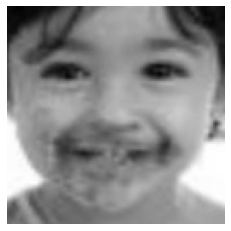

In [36]:
image_index = 111
print("Original Gender = ",gender_label[test_store_gender[image_index]], "Original Age = ",test_store_age[image_index])

# Predict from model

predict_from_model = model.predict(feature_extracted2[image_index].reshape(1,128,128,1))
predict_gender = gender_label[round(predict_from_model[0][0][0])]
predict_age = round(predict_from_model[1][0][0])

print("Predicted Gender = ",predict_gender,"Predicted Age = ",predict_age)
plt.axis('off')
plt.imshow(feature_extracted2[image_index].reshape(128,128),cmap='gray')

0
Original Gender =  Male Original Age =  5
Predicted Gender =  Male Predicted Age =  20


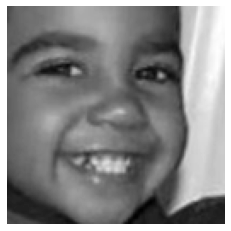

1
Original Gender =  Male Original Age =  3
Predicted Gender =  Female Predicted Age =  3


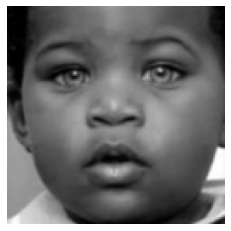

2
Original Gender =  Female Original Age =  4
Predicted Gender =  Female Predicted Age =  0


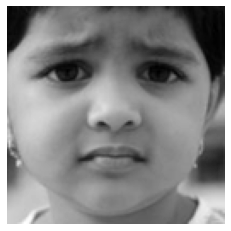

3
Original Gender =  Male Original Age =  4
Predicted Gender =  Male Predicted Age =  0


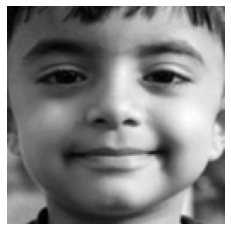

4
Original Gender =  Male Original Age =  2
Predicted Gender =  Male Predicted Age =  0


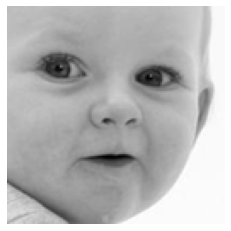

5
Original Gender =  Female Original Age =  2
Predicted Gender =  Female Predicted Age =  0


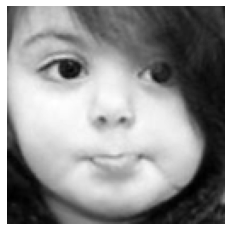

6
Original Gender =  Male Original Age =  1
Predicted Gender =  Male Predicted Age =  0


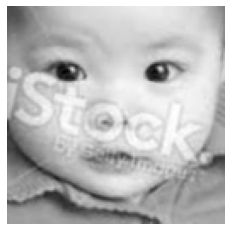

7
Original Gender =  Male Original Age =  3
Predicted Gender =  Female Predicted Age =  39


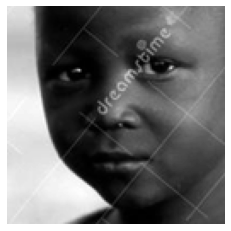

8
Original Gender =  Female Original Age =  5
Predicted Gender =  Female Predicted Age =  0


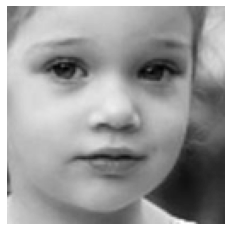

9
Original Gender =  Male Original Age =  2
Predicted Gender =  Female Predicted Age =  0


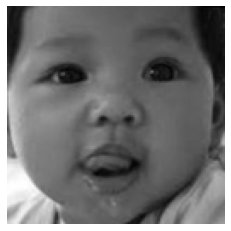

10
Original Gender =  Male Original Age =  2
Predicted Gender =  Female Predicted Age =  5


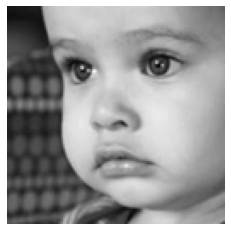

11
Original Gender =  Male Original Age =  1
Predicted Gender =  Male Predicted Age =  0


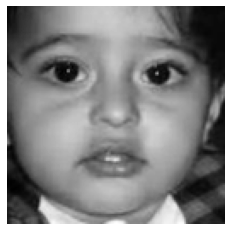

12
Original Gender =  Male Original Age =  2
Predicted Gender =  Female Predicted Age =  0


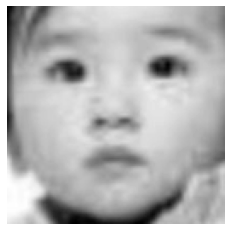

13
Original Gender =  Male Original Age =  3
Predicted Gender =  Male Predicted Age =  0


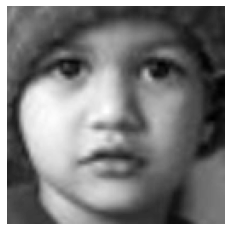

14
Original Gender =  Male Original Age =  2
Predicted Gender =  Male Predicted Age =  16


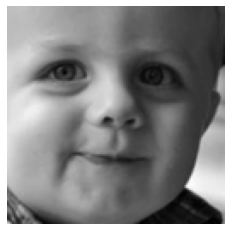

15
Original Gender =  Male Original Age =  4
Predicted Gender =  Male Predicted Age =  5


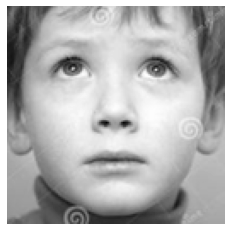

16
Original Gender =  Male Original Age =  5
Predicted Gender =  Male Predicted Age =  12


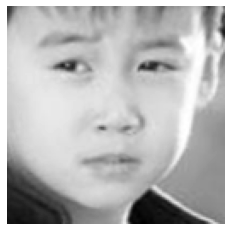

17
Original Gender =  Male Original Age =  5
Predicted Gender =  Female Predicted Age =  23


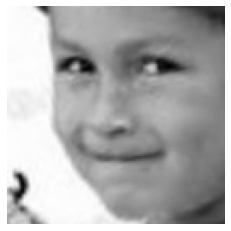

18
Original Gender =  Male Original Age =  1
Predicted Gender =  Male Predicted Age =  0


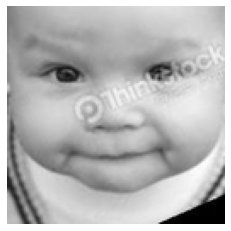

19
Original Gender =  Male Original Age =  1
Predicted Gender =  Female Predicted Age =  0


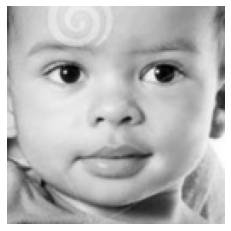

20
Original Gender =  Male Original Age =  3
Predicted Gender =  Male Predicted Age =  10


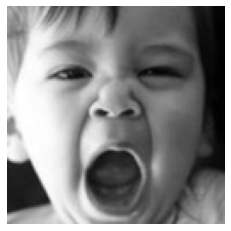

21
Original Gender =  Female Original Age =  1
Predicted Gender =  Male Predicted Age =  0


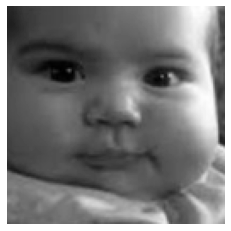

22
Original Gender =  Female Original Age =  5
Predicted Gender =  Female Predicted Age =  1


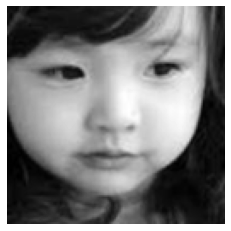

23
Original Gender =  Female Original Age =  3
Predicted Gender =  Female Predicted Age =  7


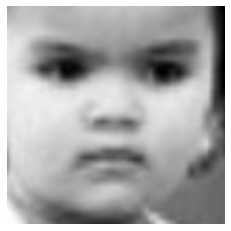

24
Original Gender =  Male Original Age =  4
Predicted Gender =  Male Predicted Age =  0


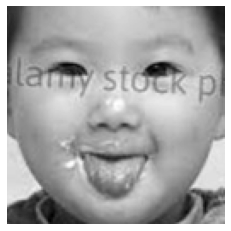

25
Original Gender =  Male Original Age =  3
Predicted Gender =  Male Predicted Age =  0


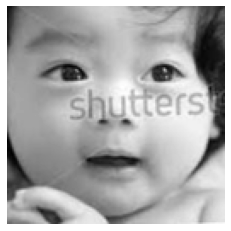

26
Original Gender =  Male Original Age =  2
Predicted Gender =  Male Predicted Age =  1


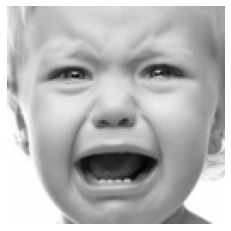

27
Original Gender =  Male Original Age =  3
Predicted Gender =  Male Predicted Age =  0


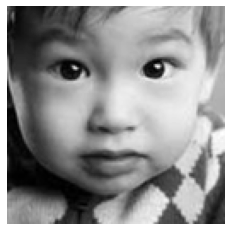

28
Original Gender =  Male Original Age =  1
Predicted Gender =  Male Predicted Age =  0


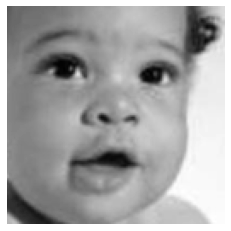

29
Original Gender =  Male Original Age =  21
Predicted Gender =  Male Predicted Age =  2


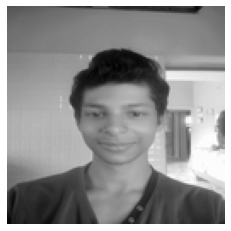

30
Original Gender =  Female Original Age =  3
Predicted Gender =  Female Predicted Age =  0


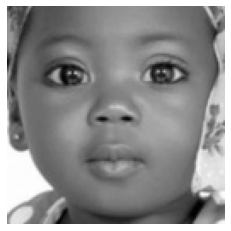

31
Original Gender =  Female Original Age =  1
Predicted Gender =  Female Predicted Age =  0


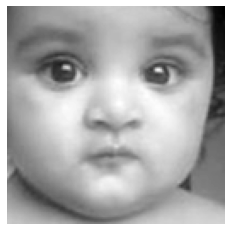

32
Original Gender =  Male Original Age =  1
Predicted Gender =  Male Predicted Age =  0


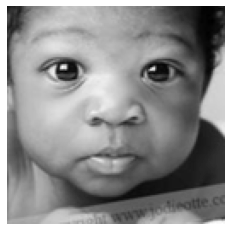

33
Original Gender =  Male Original Age =  2
Predicted Gender =  Male Predicted Age =  0


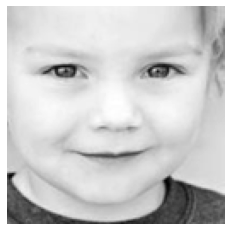

34
Original Gender =  Female Original Age =  5
Predicted Gender =  Female Predicted Age =  0


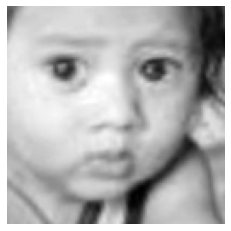

35
Original Gender =  Male Original Age =  1
Predicted Gender =  Female Predicted Age =  0


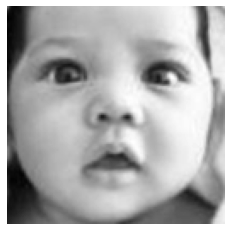

36
Original Gender =  Female Original Age =  5
Predicted Gender =  Female Predicted Age =  15


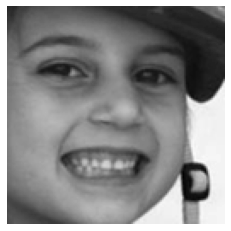

37
Original Gender =  Male Original Age =  21
Predicted Gender =  Female Predicted Age =  56


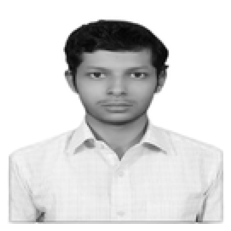

38
Original Gender =  Male Original Age =  3
Predicted Gender =  Male Predicted Age =  17


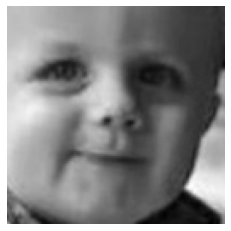

39
Original Gender =  Female Original Age =  2
Predicted Gender =  Female Predicted Age =  0


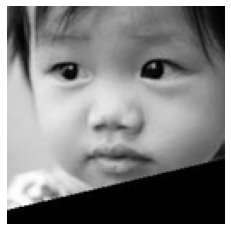

40
Original Gender =  Male Original Age =  5
Predicted Gender =  Male Predicted Age =  0


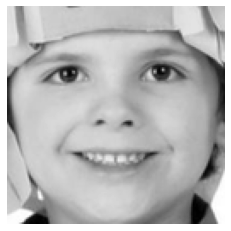

41
Original Gender =  Female Original Age =  2
Predicted Gender =  Female Predicted Age =  8


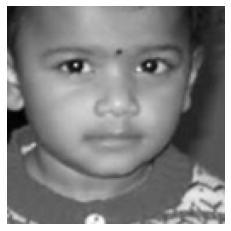

42
Original Gender =  Female Original Age =  2
Predicted Gender =  Female Predicted Age =  0


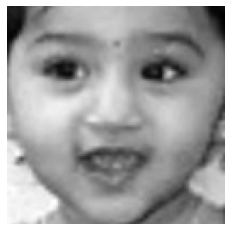

43
Original Gender =  Male Original Age =  5
Predicted Gender =  Male Predicted Age =  7


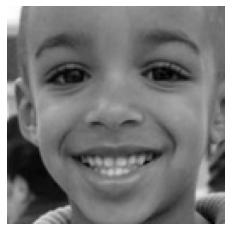

44
Original Gender =  Female Original Age =  4
Predicted Gender =  Female Predicted Age =  12


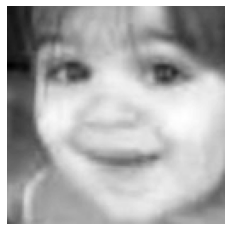

45
Original Gender =  Male Original Age =  25
Predicted Gender =  Male Predicted Age =  28


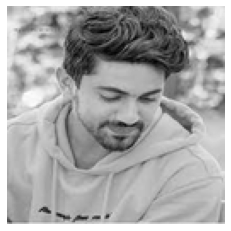

46
Original Gender =  Male Original Age =  1
Predicted Gender =  Male Predicted Age =  0


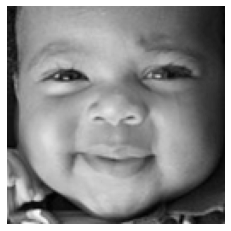

47
Original Gender =  Female Original Age =  4
Predicted Gender =  Female Predicted Age =  0


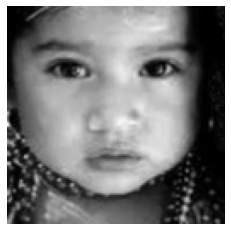

48
Original Gender =  Male Original Age =  2
Predicted Gender =  Male Predicted Age =  0


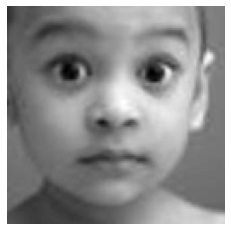

49
Original Gender =  Female Original Age =  4
Predicted Gender =  Female Predicted Age =  17


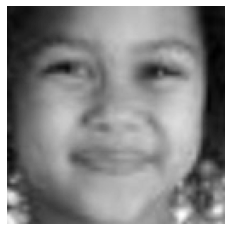

50
Original Gender =  Male Original Age =  3
Predicted Gender =  Male Predicted Age =  0


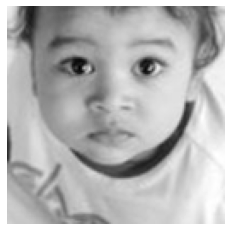

51
Original Gender =  Male Original Age =  1
Predicted Gender =  Female Predicted Age =  1


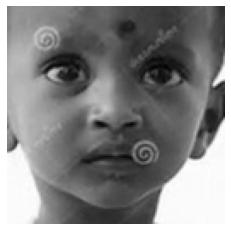

52
Original Gender =  Female Original Age =  2
Predicted Gender =  Female Predicted Age =  0


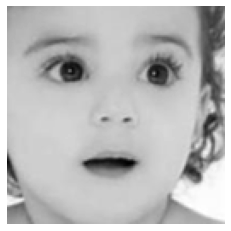

53
Original Gender =  Male Original Age =  21
Predicted Gender =  Female Predicted Age =  50


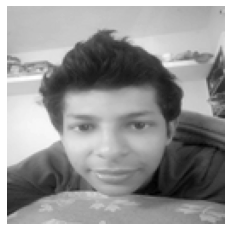

54
Original Gender =  Female Original Age =  2
Predicted Gender =  Male Predicted Age =  0


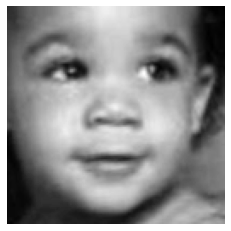

55
Original Gender =  Male Original Age =  4
Predicted Gender =  Male Predicted Age =  0


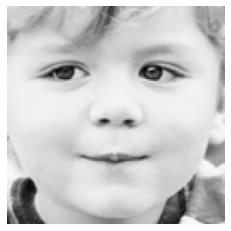

56
Original Gender =  Female Original Age =  2
Predicted Gender =  Female Predicted Age =  0


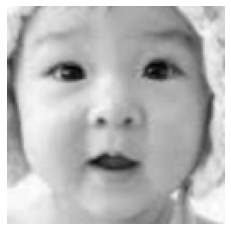

57
Original Gender =  Female Original Age =  3
Predicted Gender =  Male Predicted Age =  0


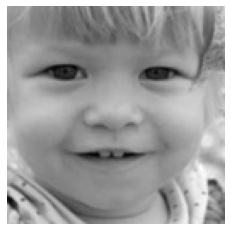

58
Original Gender =  Female Original Age =  3
Predicted Gender =  Female Predicted Age =  8


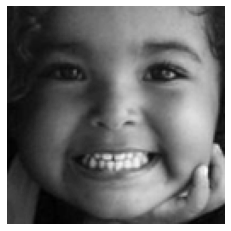

59
Original Gender =  Male Original Age =  1
Predicted Gender =  Male Predicted Age =  0


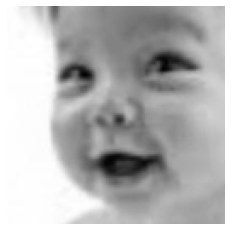

60
Original Gender =  Female Original Age =  4
Predicted Gender =  Female Predicted Age =  0


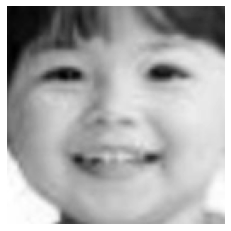

61
Original Gender =  Male Original Age =  1
Predicted Gender =  Male Predicted Age =  0


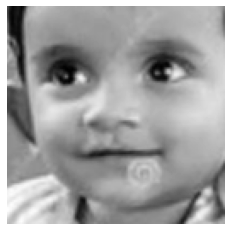

62
Original Gender =  Male Original Age =  2
Predicted Gender =  Male Predicted Age =  5


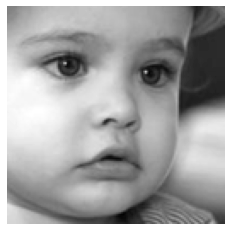

63
Original Gender =  Female Original Age =  3
Predicted Gender =  Female Predicted Age =  0


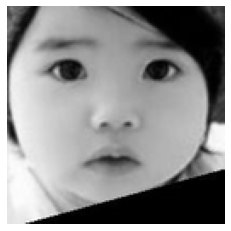

64
Original Gender =  Male Original Age =  2
Predicted Gender =  Female Predicted Age =  0


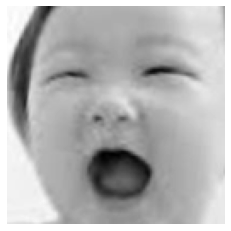

65
Original Gender =  Female Original Age =  1
Predicted Gender =  Male Predicted Age =  0


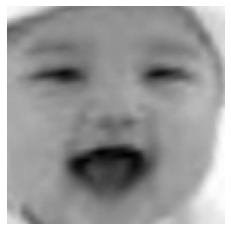

66
Original Gender =  Female Original Age =  4
Predicted Gender =  Male Predicted Age =  3


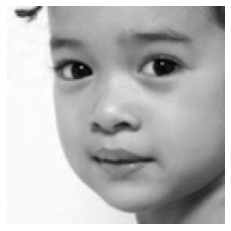

67
Original Gender =  Female Original Age =  1
Predicted Gender =  Female Predicted Age =  0


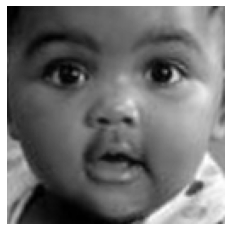

68
Original Gender =  Male Original Age =  2
Predicted Gender =  Female Predicted Age =  8


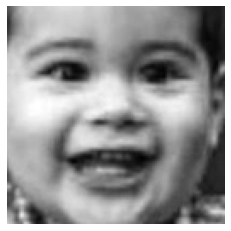

69
Original Gender =  Female Original Age =  3
Predicted Gender =  Female Predicted Age =  14


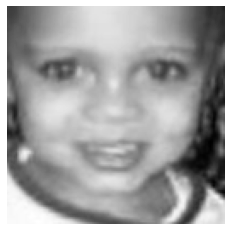

70
Original Gender =  Female Original Age =  5
Predicted Gender =  Male Predicted Age =  4


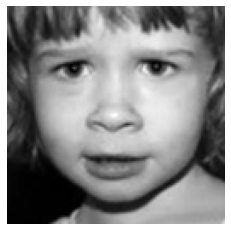

71
Original Gender =  Female Original Age =  5
Predicted Gender =  Female Predicted Age =  7


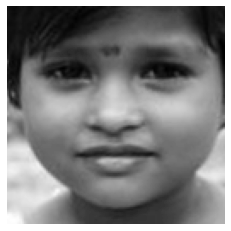

72
Original Gender =  Male Original Age =  1
Predicted Gender =  Male Predicted Age =  0


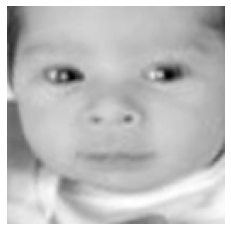

73
Original Gender =  Female Original Age =  5
Predicted Gender =  Male Predicted Age =  0


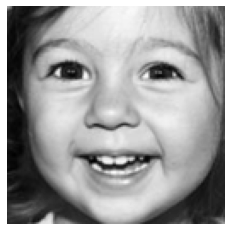

74
Original Gender =  Female Original Age =  5
Predicted Gender =  Female Predicted Age =  2


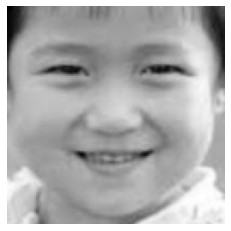

75
Original Gender =  Female Original Age =  1
Predicted Gender =  Female Predicted Age =  0


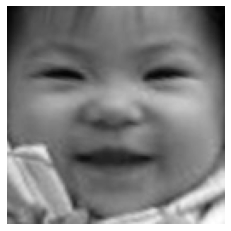

76
Original Gender =  Female Original Age =  1
Predicted Gender =  Female Predicted Age =  5


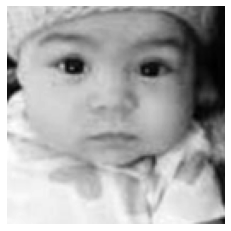

77
Original Gender =  Male Original Age =  2
Predicted Gender =  Female Predicted Age =  0


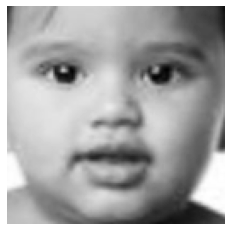

78
Original Gender =  Male Original Age =  4
Predicted Gender =  Female Predicted Age =  0


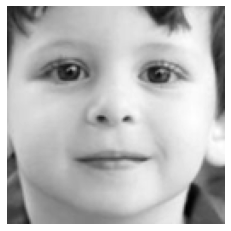

79
Original Gender =  Female Original Age =  2
Predicted Gender =  Female Predicted Age =  0


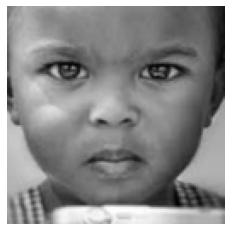

80
Original Gender =  Male Original Age =  3
Predicted Gender =  Female Predicted Age =  0


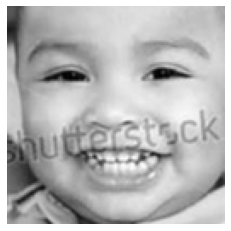

81
Original Gender =  Male Original Age =  2
Predicted Gender =  Female Predicted Age =  11


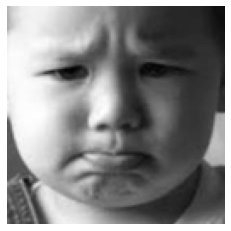

82
Original Gender =  Male Original Age =  4
Predicted Gender =  Male Predicted Age =  0


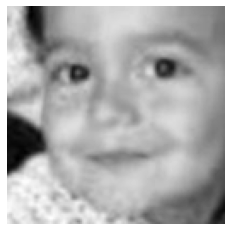

83
Original Gender =  Female Original Age =  1
Predicted Gender =  Male Predicted Age =  0


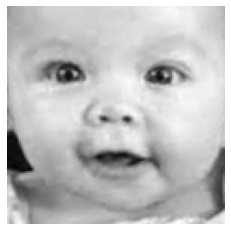

84
Original Gender =  Male Original Age =  1
Predicted Gender =  Male Predicted Age =  0


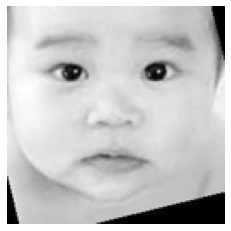

85
Original Gender =  Male Original Age =  2
Predicted Gender =  Female Predicted Age =  0


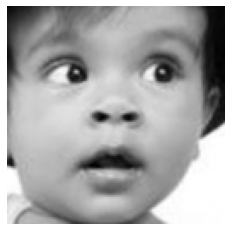

86
Original Gender =  Male Original Age =  3
Predicted Gender =  Male Predicted Age =  17


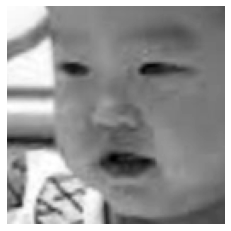

87
Original Gender =  Female Original Age =  2
Predicted Gender =  Female Predicted Age =  0


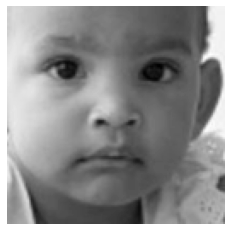

88
Original Gender =  Male Original Age =  2
Predicted Gender =  Male Predicted Age =  0


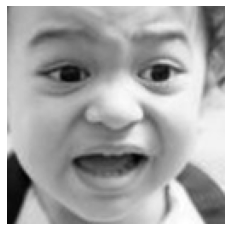

89
Original Gender =  Female Original Age =  2
Predicted Gender =  Female Predicted Age =  0


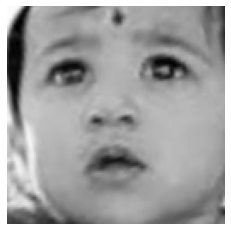

90
Original Gender =  Female Original Age =  116
Predicted Gender =  Female Predicted Age =  106


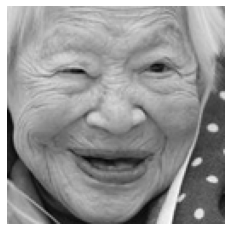

91
Original Gender =  Female Original Age =  1
Predicted Gender =  Female Predicted Age =  0


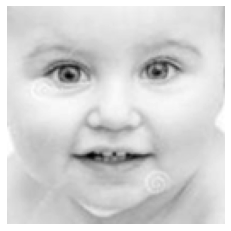

92
Original Gender =  Male Original Age =  1
Predicted Gender =  Male Predicted Age =  0


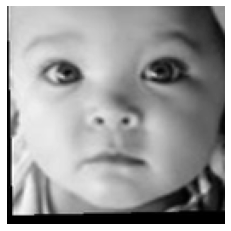

93
Original Gender =  Male Original Age =  1
Predicted Gender =  Male Predicted Age =  0


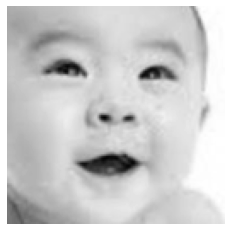

94
Original Gender =  Female Original Age =  2
Predicted Gender =  Female Predicted Age =  0


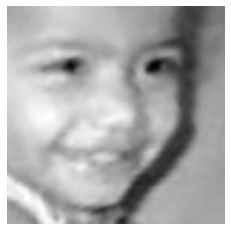

95
Original Gender =  Female Original Age =  1
Predicted Gender =  Female Predicted Age =  0


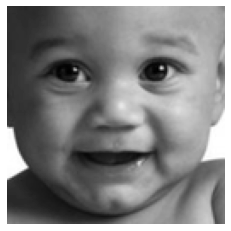

96
Original Gender =  Male Original Age =  3
Predicted Gender =  Female Predicted Age =  0


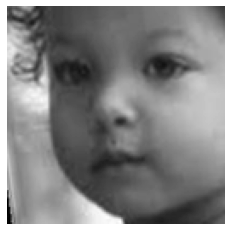

97
Original Gender =  Female Original Age =  1
Predicted Gender =  Female Predicted Age =  0


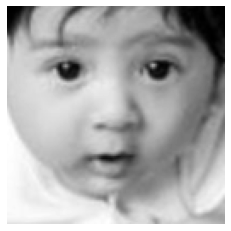

98
Original Gender =  Female Original Age =  1
Predicted Gender =  Female Predicted Age =  0


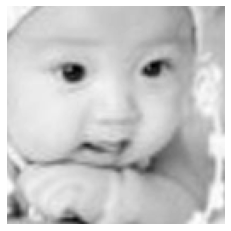

99
Original Gender =  Female Original Age =  2
Predicted Gender =  Female Predicted Age =  0


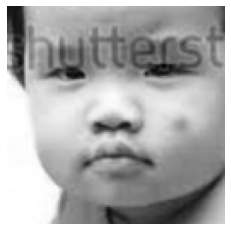

100
Original Gender =  Female Original Age =  2
Predicted Gender =  Female Predicted Age =  4


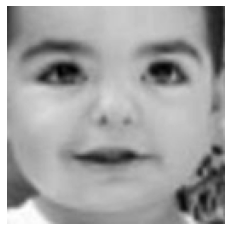

101
Original Gender =  Male Original Age =  5
Predicted Gender =  Male Predicted Age =  16


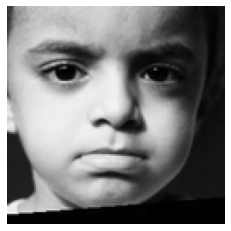

102
Original Gender =  Male Original Age =  1
Predicted Gender =  Male Predicted Age =  0


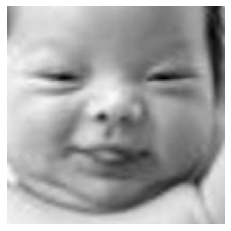

103
Original Gender =  Female Original Age =  5
Predicted Gender =  Female Predicted Age =  16


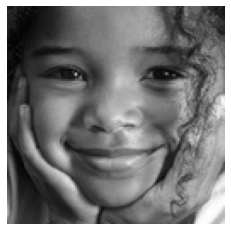

104
Original Gender =  Female Original Age =  1
Predicted Gender =  Female Predicted Age =  0


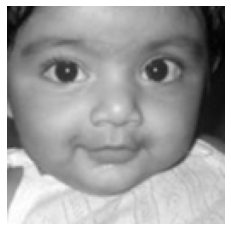

105
Original Gender =  Female Original Age =  3
Predicted Gender =  Female Predicted Age =  0


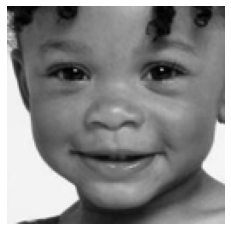

106
Original Gender =  Female Original Age =  2
Predicted Gender =  Female Predicted Age =  5


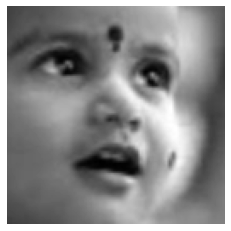

107
Original Gender =  Male Original Age =  1
Predicted Gender =  Female Predicted Age =  0


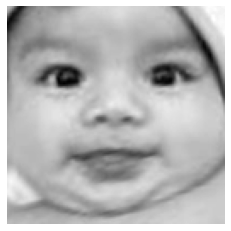

108
Original Gender =  Male Original Age =  1
Predicted Gender =  Male Predicted Age =  0


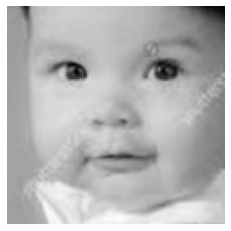

109
Original Gender =  Female Original Age =  1
Predicted Gender =  Female Predicted Age =  0


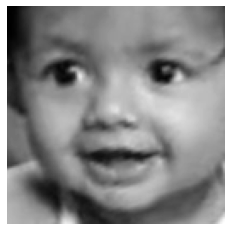

110
Original Gender =  Female Original Age =  4
Predicted Gender =  Female Predicted Age =  20


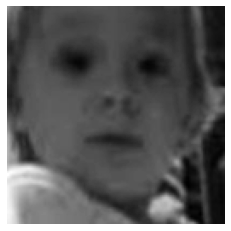

111
Original Gender =  Male Original Age =  2
Predicted Gender =  Female Predicted Age =  0


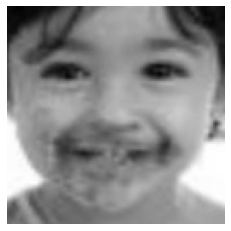

112
Original Gender =  Male Original Age =  1
Predicted Gender =  Male Predicted Age =  0


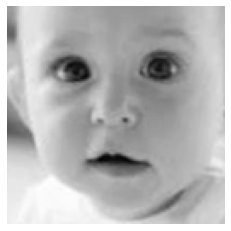

113
Original Gender =  Male Original Age =  4
Predicted Gender =  Female Predicted Age =  0


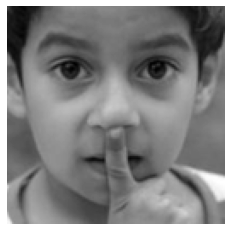

114
Original Gender =  Female Original Age =  5
Predicted Gender =  Male Predicted Age =  11


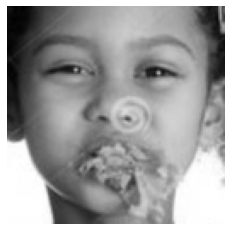

115
Original Gender =  Male Original Age =  1
Predicted Gender =  Female Predicted Age =  0


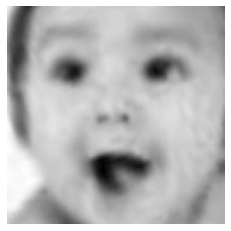

116
Original Gender =  Male Original Age =  110
Predicted Gender =  Male Predicted Age =  81


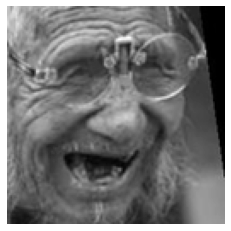

117
Original Gender =  Male Original Age =  1
Predicted Gender =  Male Predicted Age =  0


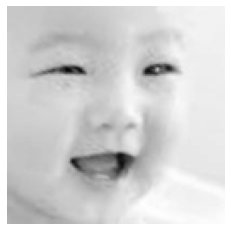

118
Original Gender =  Female Original Age =  3
Predicted Gender =  Male Predicted Age =  0


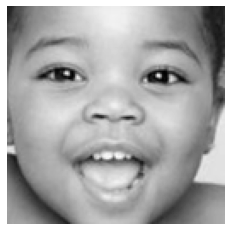

119
Original Gender =  Male Original Age =  2
Predicted Gender =  Male Predicted Age =  1


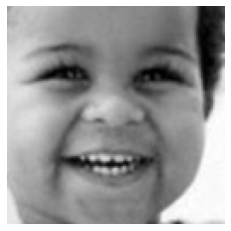

120
Original Gender =  Male Original Age =  1
Predicted Gender =  Male Predicted Age =  9


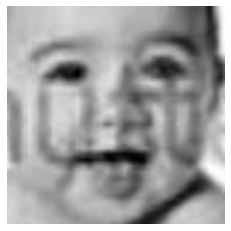

121
Original Gender =  Male Original Age =  4
Predicted Gender =  Female Predicted Age =  0


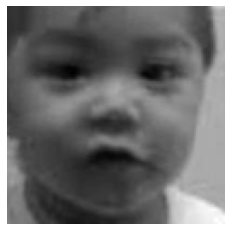

122
Original Gender =  Female Original Age =  5
Predicted Gender =  Female Predicted Age =  11


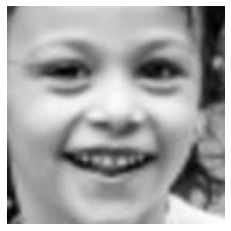

123
Original Gender =  Male Original Age =  1
Predicted Gender =  Female Predicted Age =  0


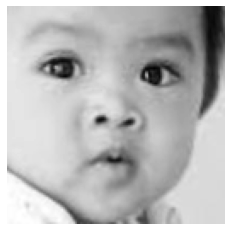

124
Original Gender =  Male Original Age =  1
Predicted Gender =  Male Predicted Age =  0


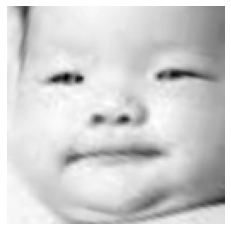

125
Original Gender =  Female Original Age =  1
Predicted Gender =  Female Predicted Age =  0


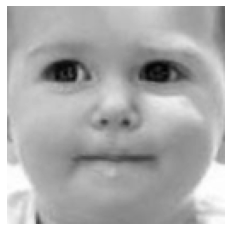

126
Original Gender =  Female Original Age =  4
Predicted Gender =  Female Predicted Age =  0


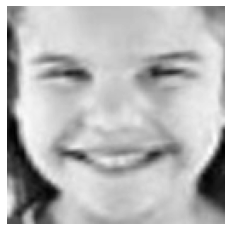

127
Original Gender =  Male Original Age =  25
Predicted Gender =  Male Predicted Age =  33


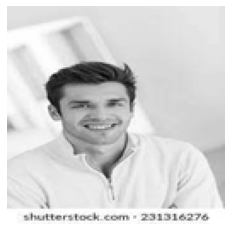

128
Original Gender =  Female Original Age =  1
Predicted Gender =  Female Predicted Age =  0


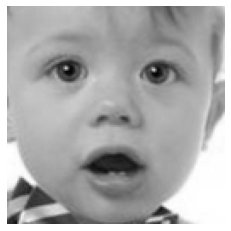

129
Original Gender =  Female Original Age =  5
Predicted Gender =  Male Predicted Age =  13


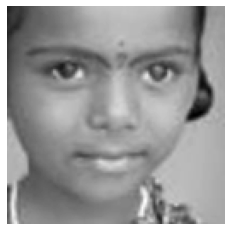

130
Original Gender =  Male Original Age =  2
Predicted Gender =  Male Predicted Age =  0


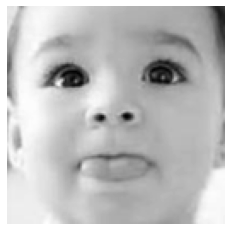

131
Original Gender =  Male Original Age =  1
Predicted Gender =  Male Predicted Age =  0


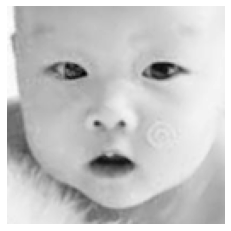

132
Original Gender =  Female Original Age =  4
Predicted Gender =  Female Predicted Age =  8


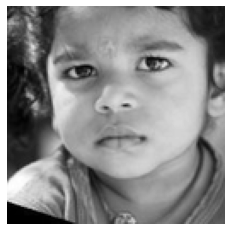

133
Original Gender =  Female Original Age =  2
Predicted Gender =  Male Predicted Age =  0


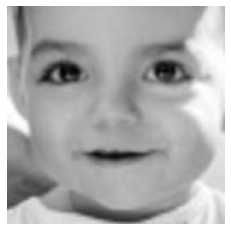

134
Original Gender =  Female Original Age =  4
Predicted Gender =  Female Predicted Age =  0


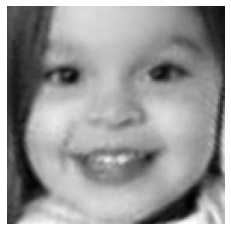

135
Original Gender =  Male Original Age =  5
Predicted Gender =  Male Predicted Age =  17


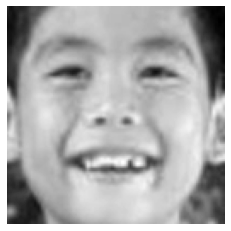

136
Original Gender =  Male Original Age =  4
Predicted Gender =  Female Predicted Age =  0


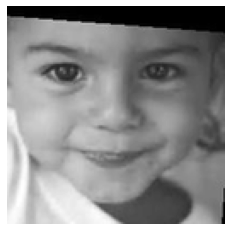

137
Original Gender =  Male Original Age =  5
Predicted Gender =  Male Predicted Age =  4


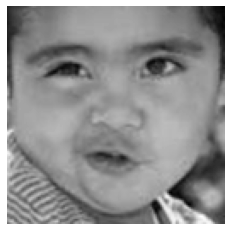

138
Original Gender =  Female Original Age =  5
Predicted Gender =  Male Predicted Age =  44


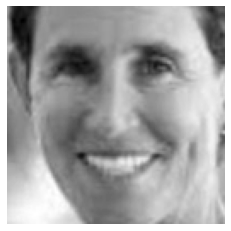

139
Original Gender =  Male Original Age =  3
Predicted Gender =  Female Predicted Age =  10


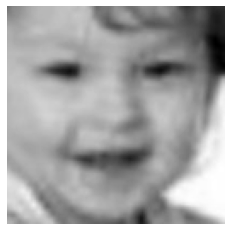

140
Original Gender =  Female Original Age =  1
Predicted Gender =  Male Predicted Age =  0


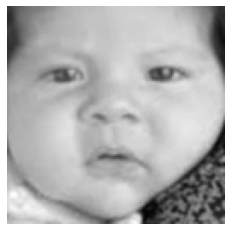

141
Original Gender =  Male Original Age =  21
Predicted Gender =  Female Predicted Age =  33


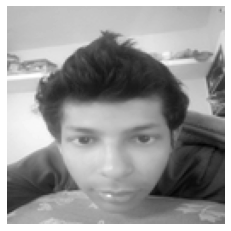

142
Original Gender =  Female Original Age =  1
Predicted Gender =  Male Predicted Age =  0


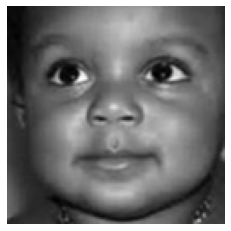

143
Original Gender =  Male Original Age =  3
Predicted Gender =  Female Predicted Age =  0


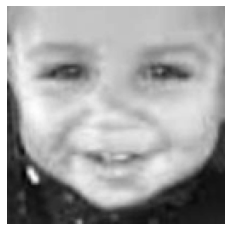

144
Original Gender =  Female Original Age =  3
Predicted Gender =  Female Predicted Age =  0


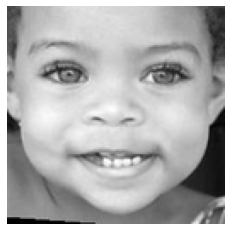

145
Original Gender =  Female Original Age =  4
Predicted Gender =  Male Predicted Age =  0


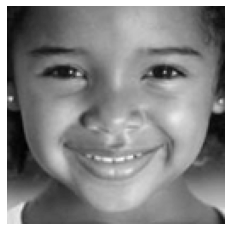

146
Original Gender =  Male Original Age =  5
Predicted Gender =  Male Predicted Age =  0


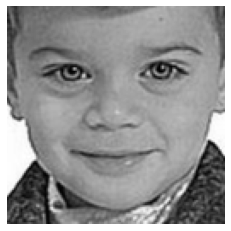

147
Original Gender =  Female Original Age =  3
Predicted Gender =  Female Predicted Age =  0


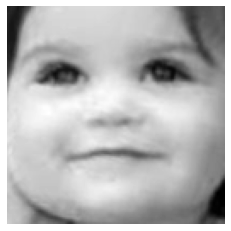

148
Original Gender =  Female Original Age =  3
Predicted Gender =  Female Predicted Age =  0


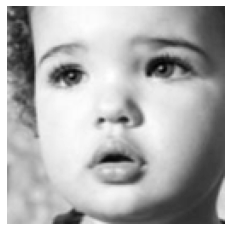

149
Original Gender =  Female Original Age =  2
Predicted Gender =  Male Predicted Age =  0


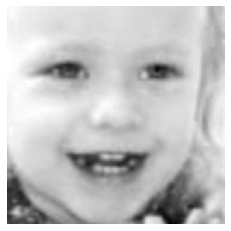

150
Original Gender =  Male Original Age =  3
Predicted Gender =  Female Predicted Age =  0


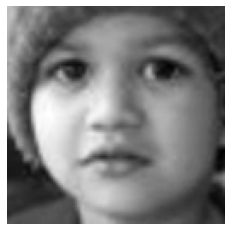

151
Original Gender =  Female Original Age =  1
Predicted Gender =  Female Predicted Age =  0


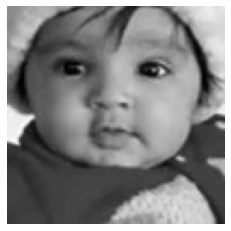

152
Original Gender =  Female Original Age =  5
Predicted Gender =  Male Predicted Age =  15


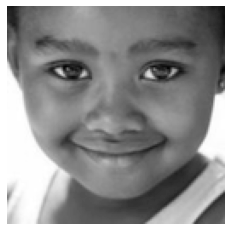

153
Original Gender =  Female Original Age =  3
Predicted Gender =  Female Predicted Age =  0


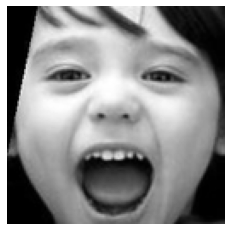

154
Original Gender =  Female Original Age =  2
Predicted Gender =  Female Predicted Age =  0


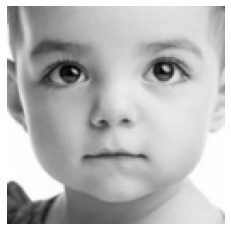

155
Original Gender =  Female Original Age =  3
Predicted Gender =  Female Predicted Age =  0


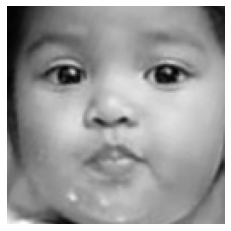

156
Original Gender =  Male Original Age =  1
Predicted Gender =  Male Predicted Age =  0


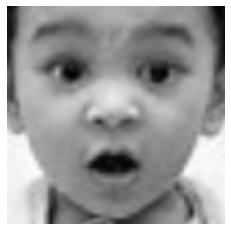

157
Original Gender =  Female Original Age =  4
Predicted Gender =  Female Predicted Age =  3


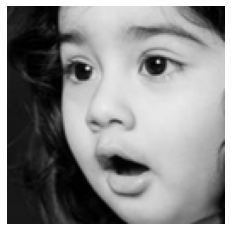

158
Original Gender =  Female Original Age =  1
Predicted Gender =  Male Predicted Age =  0


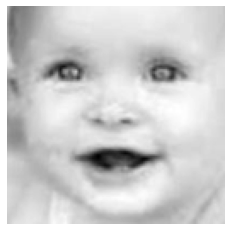

159
Original Gender =  Female Original Age =  2
Predicted Gender =  Female Predicted Age =  0


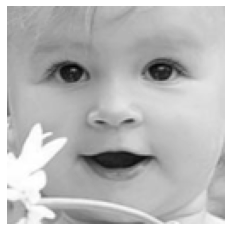

160
Original Gender =  Female Original Age =  3
Predicted Gender =  Male Predicted Age =  0


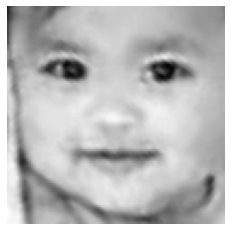

161
Original Gender =  Female Original Age =  1
Predicted Gender =  Female Predicted Age =  0


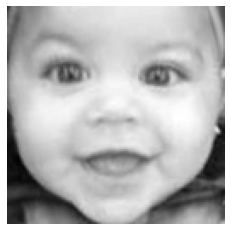

162
Original Gender =  Female Original Age =  3
Predicted Gender =  Female Predicted Age =  3


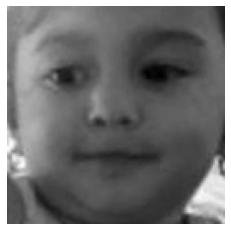

163
Original Gender =  Female Original Age =  2
Predicted Gender =  Female Predicted Age =  0


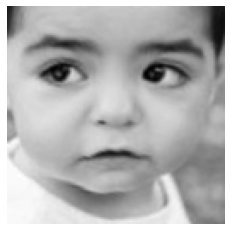

164
Original Gender =  Female Original Age =  4
Predicted Gender =  Female Predicted Age =  1


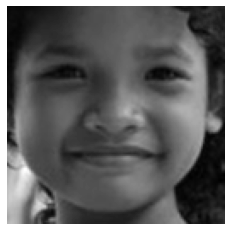

165
Original Gender =  Male Original Age =  4
Predicted Gender =  Female Predicted Age =  0


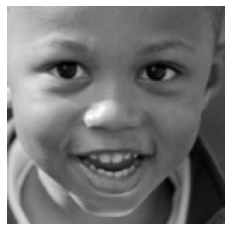

166
Original Gender =  Male Original Age =  3
Predicted Gender =  Female Predicted Age =  5


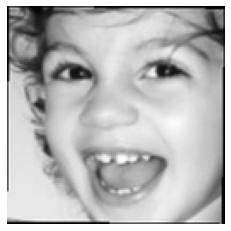

167
Original Gender =  Male Original Age =  3
Predicted Gender =  Female Predicted Age =  6


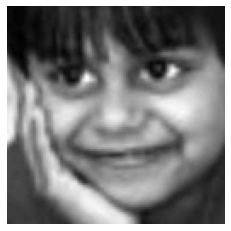

168
Original Gender =  Male Original Age =  3
Predicted Gender =  Male Predicted Age =  0


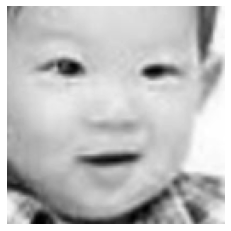

169
Original Gender =  Female Original Age =  3
Predicted Gender =  Male Predicted Age =  4


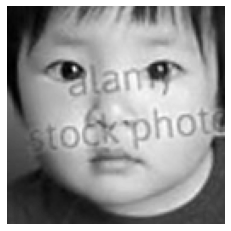

170
Original Gender =  Male Original Age =  4
Predicted Gender =  Male Predicted Age =  28


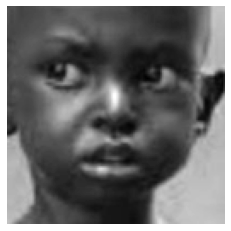

171
Original Gender =  Female Original Age =  1
Predicted Gender =  Female Predicted Age =  0


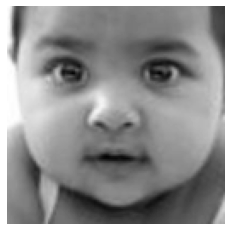

172
Original Gender =  Female Original Age =  1
Predicted Gender =  Female Predicted Age =  0


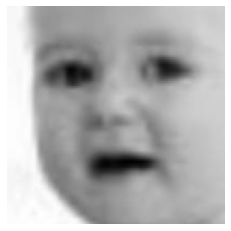

173
Original Gender =  Male Original Age =  1
Predicted Gender =  Male Predicted Age =  0


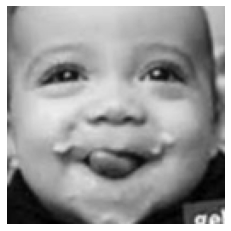

174
Original Gender =  Female Original Age =  2
Predicted Gender =  Female Predicted Age =  0


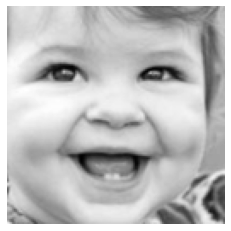

175
Original Gender =  Female Original Age =  5
Predicted Gender =  Male Predicted Age =  0


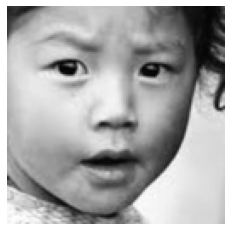

176
Original Gender =  Male Original Age =  1
Predicted Gender =  Male Predicted Age =  0


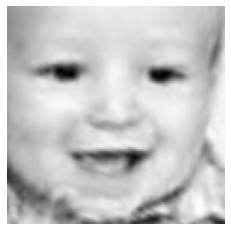

177
Original Gender =  Male Original Age =  4
Predicted Gender =  Female Predicted Age =  16


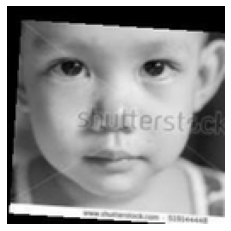

178
Original Gender =  Male Original Age =  2
Predicted Gender =  Female Predicted Age =  1


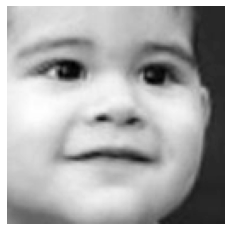

179
Original Gender =  Male Original Age =  5
Predicted Gender =  Male Predicted Age =  25


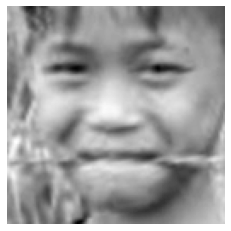

180
Original Gender =  Male Original Age =  3
Predicted Gender =  Female Predicted Age =  0


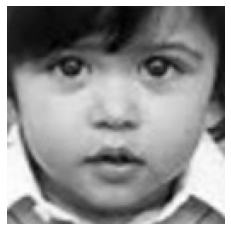

181
Original Gender =  Female Original Age =  1
Predicted Gender =  Female Predicted Age =  0


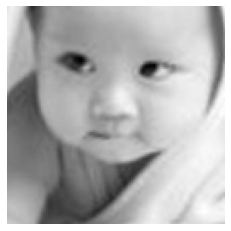

182
Original Gender =  Female Original Age =  4
Predicted Gender =  Female Predicted Age =  9


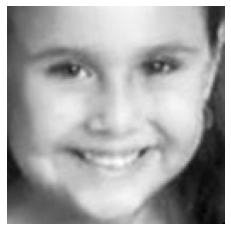

183
Original Gender =  Male Original Age =  3
Predicted Gender =  Male Predicted Age =  8


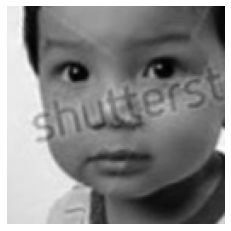

184
Original Gender =  Female Original Age =  2
Predicted Gender =  Female Predicted Age =  27


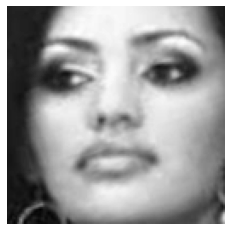

185
Original Gender =  Female Original Age =  1
Predicted Gender =  Male Predicted Age =  0


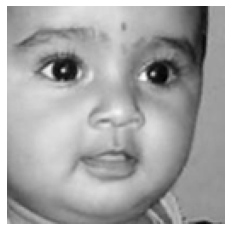

186
Original Gender =  Male Original Age =  3
Predicted Gender =  Female Predicted Age =  0


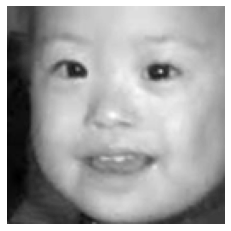

187
Original Gender =  Male Original Age =  2
Predicted Gender =  Male Predicted Age =  8


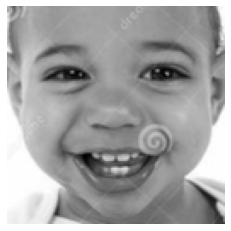

188
Original Gender =  Male Original Age =  4
Predicted Gender =  Male Predicted Age =  14


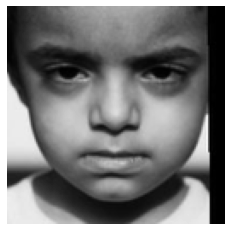

189
Original Gender =  Male Original Age =  4
Predicted Gender =  Female Predicted Age =  0


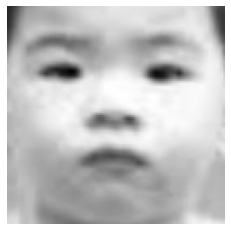

190
Original Gender =  Male Original Age =  5
Predicted Gender =  Male Predicted Age =  10


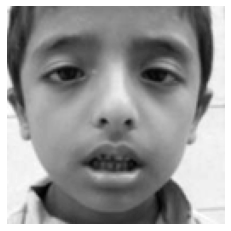

191
Original Gender =  Male Original Age =  5
Predicted Gender =  Male Predicted Age =  0


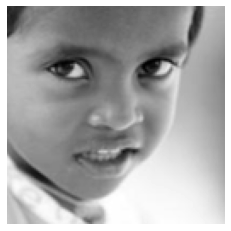

192
Original Gender =  Male Original Age =  1
Predicted Gender =  Female Predicted Age =  0


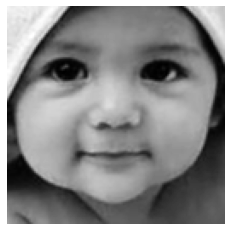

193
Original Gender =  Male Original Age =  2
Predicted Gender =  Female Predicted Age =  14


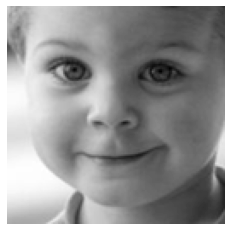

194
Original Gender =  Male Original Age =  4
Predicted Gender =  Male Predicted Age =  0


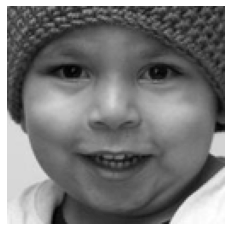

195
Original Gender =  Female Original Age =  4
Predicted Gender =  Female Predicted Age =  11


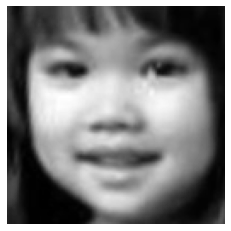

196
Original Gender =  Male Original Age =  1
Predicted Gender =  Male Predicted Age =  0


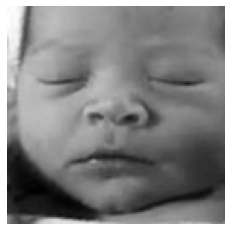

197
Original Gender =  Male Original Age =  5
Predicted Gender =  Female Predicted Age =  18


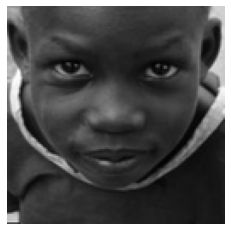

198
Original Gender =  Male Original Age =  1
Predicted Gender =  Male Predicted Age =  0


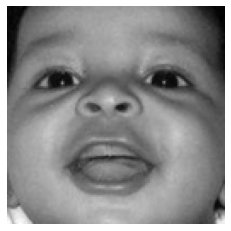

199
Original Gender =  Male Original Age =  3
Predicted Gender =  Male Predicted Age =  4


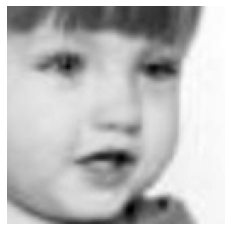

200
Original Gender =  Female Original Age =  3
Predicted Gender =  Female Predicted Age =  16


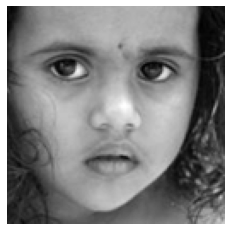

201
Original Gender =  Male Original Age =  3
Predicted Gender =  Female Predicted Age =  0


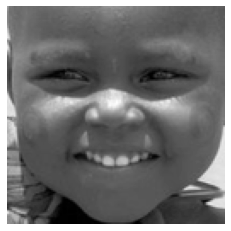

202
Original Gender =  Male Original Age =  21
Predicted Gender =  Female Predicted Age =  56


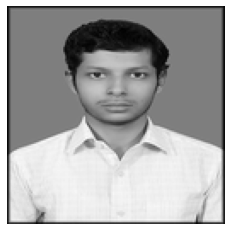

203
Original Gender =  Female Original Age =  2
Predicted Gender =  Male Predicted Age =  0


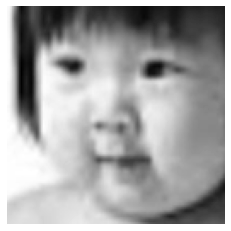

204
Original Gender =  Female Original Age =  1
Predicted Gender =  Female Predicted Age =  0


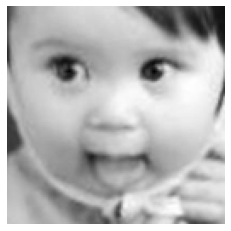

205
Original Gender =  Female Original Age =  3
Predicted Gender =  Female Predicted Age =  0


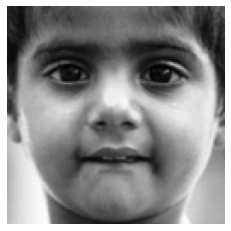

206
Original Gender =  Male Original Age =  1
Predicted Gender =  Male Predicted Age =  0


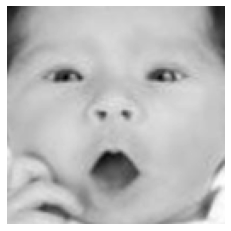

207
Original Gender =  Male Original Age =  21
Predicted Gender =  Female Predicted Age =  76


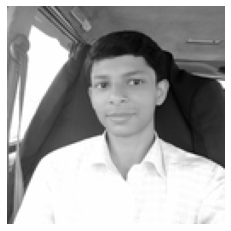

208
Original Gender =  Female Original Age =  2
Predicted Gender =  Male Predicted Age =  0


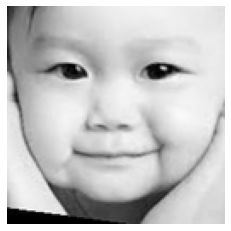

209
Original Gender =  Male Original Age =  3
Predicted Gender =  Female Predicted Age =  3


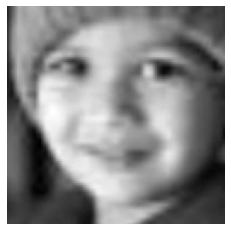

210
Original Gender =  Male Original Age =  2
Predicted Gender =  Male Predicted Age =  0


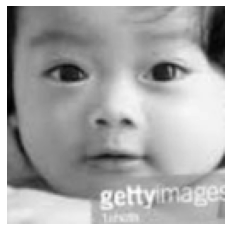

211
Original Gender =  Male Original Age =  1
Predicted Gender =  Male Predicted Age =  0


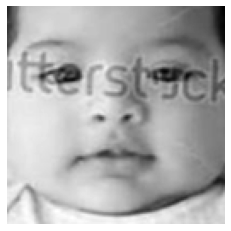

In [37]:
images=test_df.iloc[:]
for image_index, image, age, gender in images.itertuples():
    print(image_index)
    print("Original Gender = ",gender_label[test_store_gender[image_index]], "Original Age = ",test_store_age[image_index])

    # Predict from model

    predict_from_model = model.predict(feature_extracted2[image_index].reshape(1,128,128,1))
    predict_gender = gender_label[round(predict_from_model[0][0][0])]
    predict_age = round(predict_from_model[1][0][0])

    print("Predicted Gender = ",predict_gender,"Predicted Age = ",predict_age)
    plt.axis('off')
    plt.imshow(feature_extracted2[image_index].reshape(128,128),cmap='gray')
    plt.show()

In [38]:
train_model.history['val_gender_out_accuracy'][1]

0.7664327025413513

In [39]:
train_model.history['val_age_out_loss'][1]

10.887293815612793

In [40]:
val_gender_accuracy, val_age_accuracy = train_model.history['val_gender_out_accuracy'][-1], train_model.history['val_age_out_accuracy'][-1]
print('Validation Gender Accuracy:', val_gender_accuracy)
print('Validation Age Accuracy:', val_age_accuracy)

Validation Gender Accuracy: 0.8827909231185913
Validation Age Accuracy: 0.0025526483077555895


In [41]:
val_gender_accuracy, val_age_accuracy = train_model.history['gender_out_accuracy'][-1], train_model.history['age_out_accuracy'][-1]
print('Gender Accuracy:', val_gender_accuracy)
print('Age Accuracy:', val_age_accuracy)

Gender Accuracy: 0.9292134046554565
Age Accuracy: 0.00478647043928504
